# Boston Marthon Project

In [1]:
import pandas as pd
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.preprocessing import LabelEncoder,OneHotEncoder

from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from kmodes.kprototypes import KPrototypes

import warnings

warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('2014_results.csv', sep = ',')

In [3]:
df.shape

(31984, 21)

In [4]:
df.head()

,10k,name,division,25k,gender,age,official,bib,genderdiv,ctz,...,overall,pace,state,30k,5k,half,20k,country,city,40k
0,17.37,"Yamamoto, Hiroyuki",8,47.67,M,47,85.25,W1,8,NaN,...,8,3.27,NaN,59.18,8.02,39.72,37.65,JPN,Fukuoka,80.43
1,32.58,"Jeptoo, Rita",1,82.43,F,33,138.95,F1,1,NaN,...,21,5.30,NaN,99.33,16.22,69.47,65.83,KEN,Eldoret,132.10
2,16.62,"Van Dyk, Ernst F.",1,45.80,M,41,80.60,W2,1,NaN,...,1,3.08,NaN,56.45,7.75,38.03,36.10,RSA,Paarl,76.10
3,32.57,"Dibaba, Mare",3,82.43,F,24,140.58,F2,3,NaN,...,27,5.37,NaN,99.33,16.20,69.47,65.83,ETH,Shoa,132.95
4,17.12,"Hokinoue, Kota",2,46.37,M,40,81.23,W3,2,NaN,...,2,3.10,NaN,57.03,8.02,38.60,36.58,JPN,Nogata Fukuoka,76.72


In [5]:
df.tail()

,10k,name,division,25k,gender,age,official,bib,genderdiv,ctz,...,overall,pace,state,30k,5k,half,20k,country,city,40k
31979,50.72,"Anderson, Steve K.",3414,124.02,M,32,211.75,35908,7500,NaN,...,9849,8.08,CA,148.65,26.13,104.78,99.55,USA,Larkspur,200.22
31980,61.28,"McCarthy, Michael P.",5212,165.02,M,34,302.52,35909,15459,NaN,...,27456,11.55,MA,203.43,31.07,135.85,128.37,USA,Norwell,285.47
31981,59.00,"Brimmer, Delia C.",5231,157.02,F,21,282.00,35910,10788,NaN,...,25092,10.77,CT,192.65,28.18,130.57,123.33,USA,West Simsbury,266.30
31982,63.75,"Morganthal, Amy",5800,167.82,F,38,302.73,35911,12009,NaN,...,27476,11.55,MA,207.52,30.98,137.03,129.90,USA,North Andover,285.87
31983,53.63,"Kirchner, Jeffrey T.",1396,135.02,M,54,228.30,35912,9771,NaN,...,14844,8.72,PA,161.83,26.92,114.13,108.03,USA,Lancaster,216.48


In [6]:
df.columns

Index(['10k', 'name', 'division', '25k', 'gender', 'age', 'official', 'bib',
       'genderdiv', 'ctz', '35k', 'overall', 'pace', 'state', '30k', '5k',
       'half', '20k', 'country', 'city', '40k'],
      dtype='object')

In [7]:
cols = ['bib','name','gender','age','pace','5k','10k','half','20k', '25k','30k','35k','40k', 'overall','official','division',
       'genderdiv', 'ctz', 'country',  'state', 'city']

In [8]:
df = df[cols]

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31984 entries, 0 to 31983
Data columns (total 21 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   bib        31984 non-null  object 
 1   name       31984 non-null  object 
 2   gender     31984 non-null  object 
 3   age        31984 non-null  int64  
 4   pace       31984 non-null  float64
 5   5k         31984 non-null  object 
 6   10k        31984 non-null  object 
 7   half       31984 non-null  object 
 8   20k        31984 non-null  object 
 9   25k        31984 non-null  object 
 10  30k        31984 non-null  object 
 11  35k        31984 non-null  object 
 12  40k        31984 non-null  object 
 13  overall    31984 non-null  int64  
 14  official   31984 non-null  float64
 15  division   31984 non-null  int64  
 16  genderdiv  31984 non-null  int64  
 17  ctz        1244 non-null   object 
 18  country    31984 non-null  object 
 19  state      29408 non-null  object 
 20  city  

In [10]:
numeric = ['10k', 'division', '25k', 'age', 'official',
       'genderdiv', '35k', 'overall', 'pace', '30k', '5k',
       'half', '20k','40k']
categorical = ['name','gender','bib','ctz','state', 'country', 'city']

In [11]:
# convert to numeric data
df[numeric] = df[numeric].apply(pd.to_numeric, errors = 'coerce', axis=1)
print(df.dtypes)

bib           object
name          object
gender        object
age          float64
pace         float64
5k           float64
10k          float64
half         float64
20k          float64
25k          float64
30k          float64
35k          float64
40k          float64
overall      float64
official     float64
division     float64
genderdiv    float64
ctz           object
country       object
state         object
city          object
dtype: object


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31984 entries, 0 to 31983
Data columns (total 21 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   bib        31984 non-null  object 
 1   name       31984 non-null  object 
 2   gender     31984 non-null  object 
 3   age        31984 non-null  float64
 4   pace       31984 non-null  float64
 5   5k         31932 non-null  float64
 6   10k        31934 non-null  float64
 7   half       31912 non-null  float64
 8   20k        31933 non-null  float64
 9   25k        31768 non-null  float64
 10  30k        31944 non-null  float64
 11  35k        31950 non-null  float64
 12  40k        31945 non-null  float64
 13  overall    31984 non-null  float64
 14  official   31984 non-null  float64
 15  division   31984 non-null  float64
 16  genderdiv  31984 non-null  float64
 17  ctz        1244 non-null   object 
 18  country    31984 non-null  object 
 19  state      29408 non-null  object 
 20  city  

### Missing values

In [13]:
null_dt = df.isnull().sum().reset_index()
null_dt.columns = ['index','null']
null_dt['null'] = null_dt['null']/len(df)*100
null_dt['total'] = 100
null_dt

,index,null,total
0,bib,0.000000,100
1,name,0.000000,100
2,gender,0.000000,100
3,age,0.000000,100
4,pace,0.000000,100
5,5k,0.162581,100
6,10k,0.156328,100
7,half,0.225113,100
8,20k,0.159455,100
9,25k,0.675338,100


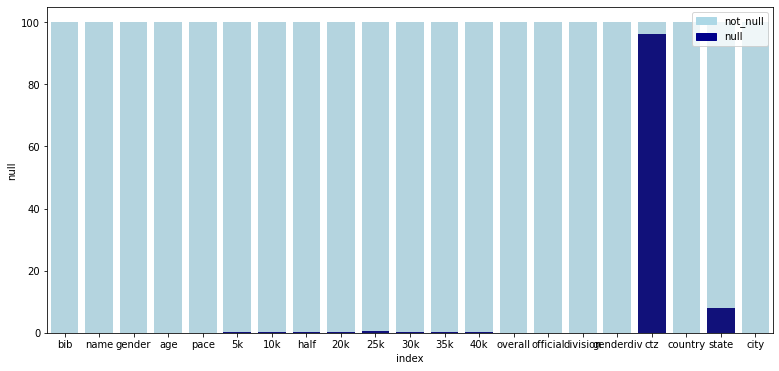

In [14]:
#Plot null data
plt.figure(figsize=(13, 6))
bar1 = sns.barplot(x="index",  y='total', data=null_dt, color='lightblue')
bar2 = sns.barplot(x="index", y='null', data=null_dt, color='darkblue')
top_bar = mpatches.Patch(color='lightblue', label='not_null')
bottom_bar = mpatches.Patch(color='darkblue', label='null')
plt.legend(handles=[top_bar, bottom_bar], loc=1)
plt.show()

In [15]:
df = df.drop(columns='ctz')

In [16]:
df = df.dropna()

In [17]:
df.shape

(29103, 20)

In [18]:
df.describe()

,age,pace,5k,10k,half,20k,25k,30k,35k,40k,overall,official,division,genderdiv
count,29103.000000,29103.000000,29103.000000,29103.000000,29103.000000,29103.000000,29103.000000,29103.000000,29103.000000,29103.000000,29103.000000,29103.000000,29103.000000,29103.000000
mean,42.054256,9.269305,25.779254,51.827082,111.639899,105.728655,134.107068,164.525433,196.771704,229.037616,15980.928942,242.813434,1966.941037,8008.425935
std,11.348288,1.942165,4.207013,8.704309,20.333671,19.186131,25.627832,32.965134,40.869530,48.164805,9169.893647,50.921669,1732.202728,4733.455790
min,18.000000,3.250000,8.020000,17.120000,40.200000,38.020000,48.550000,59.770000,70.830000,80.180000,1.000000,84.820000,1.000000,1.000000
25%,33.000000,7.870000,22.730000,45.580000,97.180000,92.070000,115.920000,141.075000,167.550000,194.280000,8074.500000,205.980000,623.500000,3954.500000
50%,42.000000,8.880000,25.150000,50.430000,108.020000,102.350000,129.230000,157.980000,188.400000,219.120000,15997.000000,232.570000,1445.000000,7923.000000
75%,50.000000,10.430000,28.500000,57.200000,123.200000,116.650000,148.430000,183.125000,220.270000,257.780000,23946.000000,273.310000,2703.500000,11908.500000
max,81.000000,20.570000,86.950000,112.380000,236.670000,224.350000,289.020000,376.380000,449.330000,508.350000,31931.000000,538.880000,6979.000000,17575.000000


In [19]:
df.describe(include='O')

,bib,name,gender,country,state,city
count,29103,29103,29103,29103,29103,29103
unique,29103,29044,2,2,68,4648
top,26880,"Murphy, Dan",M,USA,MA,Boston
freq,1,2,15578,26939,7427,1018


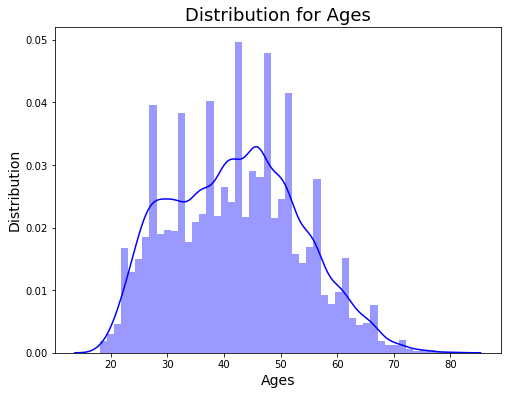

In [20]:
plt.figure(figsize=(8,6))
hage = sns.distplot(df.age, color='b')
hage.set_xlabel('Ages',fontdict= {'size':14})
hage.set_ylabel(u'Distribution',fontdict= {'size':14})
hage.set_title(u'Distribution for Ages',fontsize=18)
plt.show()

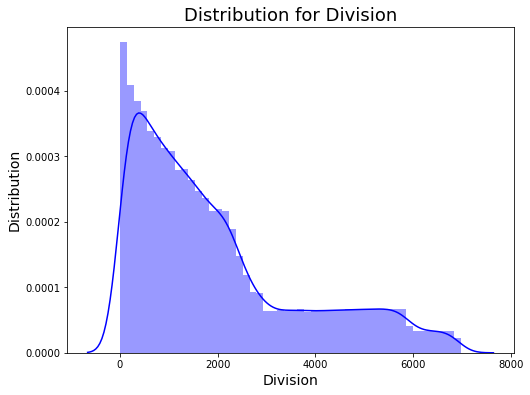

In [21]:
plt.figure(figsize=(8,6))
hage = sns.distplot(df.division, color='b')
hage.set_xlabel('Division',fontdict= {'size':14})
hage.set_ylabel(u'Distribution',fontdict= {'size':14})
hage.set_title(u'Distribution for Division',fontsize=18)
plt.show()

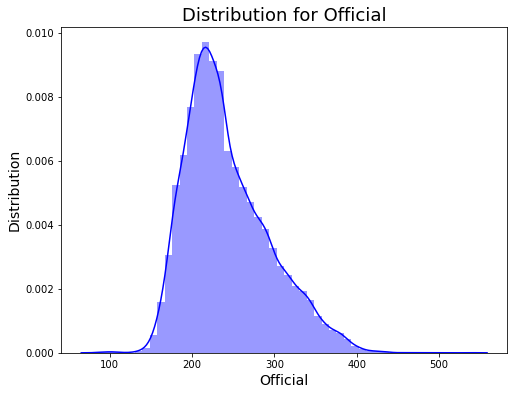

In [22]:
plt.figure(figsize=(8,6))
hage = sns.distplot(df.official, color='b')
hage.set_xlabel('Official',fontdict= {'size':14})
hage.set_ylabel(u'Distribution',fontdict= {'size':14})
hage.set_title(u'Distribution for Official',fontsize=18)
plt.show()

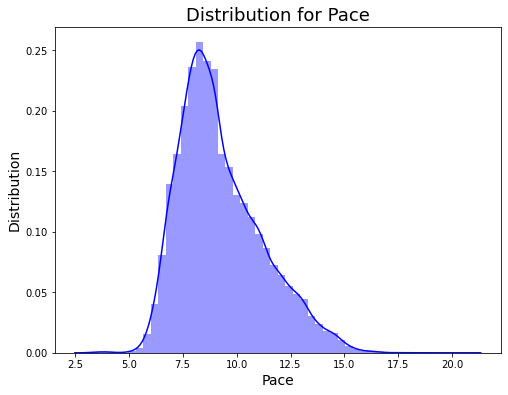

In [23]:
plt.figure(figsize=(8,6))
hage = sns.distplot(df.pace, color='b')
hage.set_xlabel('Pace',fontdict= {'size':14})
hage.set_ylabel(u'Distribution',fontdict= {'size':14})
hage.set_title(u'Distribution for Pace',fontsize=18)
plt.show()

Text(0.5, 0.98, 'Unvariate distance Plotting')

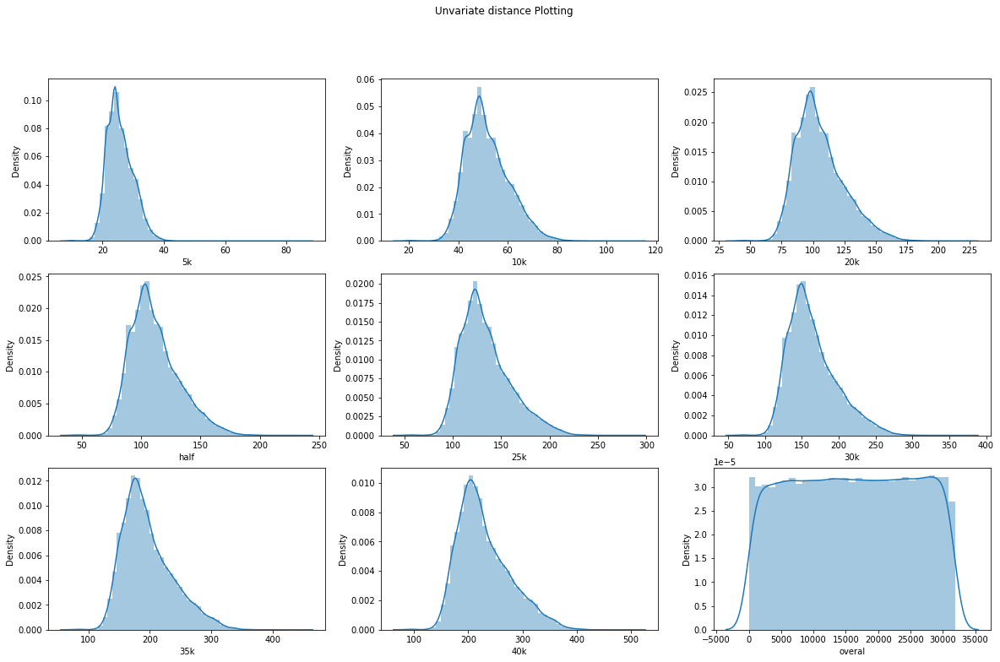

In [24]:
fig, axs = plt.subplots(3, 3, figsize=(20, 12))
sns.distplot(ax = axs[0, 0],x = df['5k'],axlabel = '5k')
sns.distplot(ax = axs[0, 1],x = df['10k'],axlabel = '10k')
sns.distplot(ax = axs[0, 2],x = df['20k'],axlabel = '20k')
sns.distplot(ax = axs[1, 0],x = df['half'],axlabel = 'half')
sns.distplot(ax = axs[1, 1],x = df['25k'],axlabel = '25k')
sns.distplot(ax = axs[1, 2],x = df['30k'],axlabel = '30k')
sns.distplot(ax = axs[2, 0],x = df['35k'],axlabel = '35k')
sns.distplot(ax = axs[2, 1],x = df['40k'],axlabel = '40k')
sns.distplot(ax = axs[2, 2],x = df['overall'],axlabel = 'overal')

fig.suptitle('Unvariate distance Plotting')

### Categorical data

In [25]:
df.describe(include='O')

,bib,name,gender,country,state,city
count,29103,29103,29103,29103,29103,29103
unique,29103,29044,2,2,68,4648
top,26880,"Murphy, Dan",M,USA,MA,Boston
freq,1,2,15578,26939,7427,1018


<AxesSubplot:xlabel='gender', ylabel='count'>

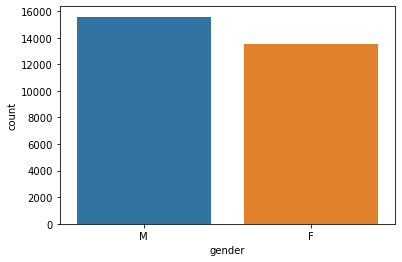

In [26]:
sns.countplot(x = 'gender', data=df)

In [27]:
country = df['country'].value_counts().to_frame()
country

,country
USA,26939
CAN,2164


In [28]:
country.loc[country['country']<50].count()

country    0
dtype: int64

In [29]:
# grouping
for i in country.loc[country['country']<50].index:
    df.loc[df['country'] == i, 'country'] = 'Other'

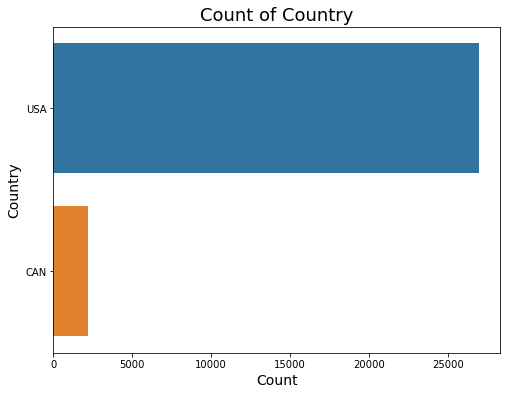

In [79]:
plt.figure(figsize=(8,6))
hage = sns.barplot(y=country.index, x =country.country, data=country)
hage.set_xlabel('Count',fontdict= {'size':14})
hage.set_ylabel(u'Country',fontdict= {'size':14})
hage.set_title(u'Count of Country',fontsize=18)
plt.show()

In [31]:
state = df['state'].value_counts().to_frame()
state

,state
MA,7427
CA,2302
NY,1537
ON,1045
PA,997
...,...
YT,5
NT,3
GU,1
AA,1


In [32]:
state.loc[state['state']<100].count()

state    26
dtype: int64

In [33]:
# grouping
for i in state.loc[state['state']<100].index:
    df.loc[df['state'] == i, 'state'] = 'Other'

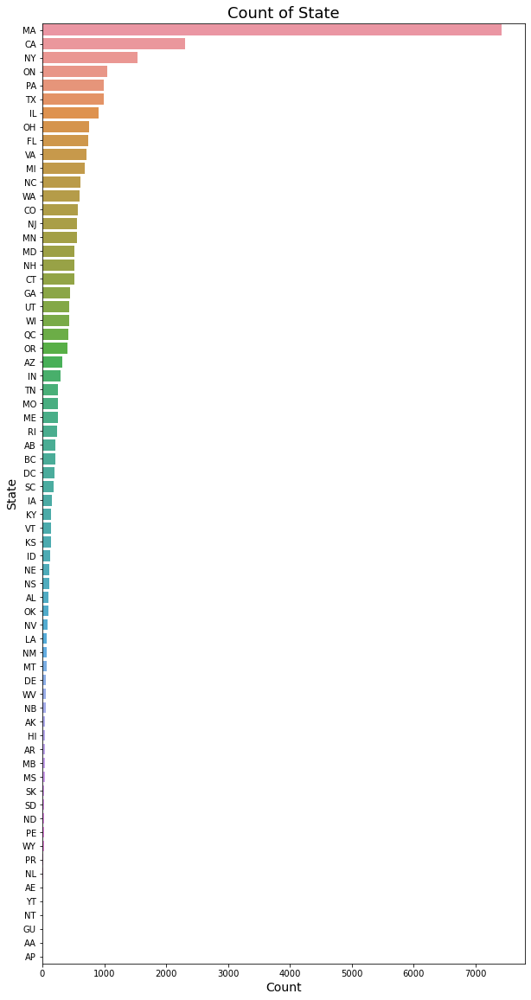

In [34]:
plt.figure(figsize=(10,20))
hage = sns.barplot(y=state.index, x=state.state, data=state)
hage.set_xlabel('Count',fontdict= {'size':14})
hage.set_ylabel(u'State',fontdict= {'size':14})
hage.set_title(u'Count of State',fontsize=18)
plt.show()

In [35]:
city = df['city'].value_counts().to_frame()
city

,city
Boston,1018
New York,497
Chicago,312
Cambridge,303
Toronto,239
...,...
Lenox Dale,1
Rolla,1
Imperial Beach,1
Hutchinson,1


In [36]:
city.loc[city['city']<100].count()

city    4617
dtype: int64

In [37]:
# grouping
for i in city.loc[city['city']<100].index:
    df.loc[df['city'] == i, 'city'] = 'Other'

In [38]:
top_city = city.loc[city['city']>100]

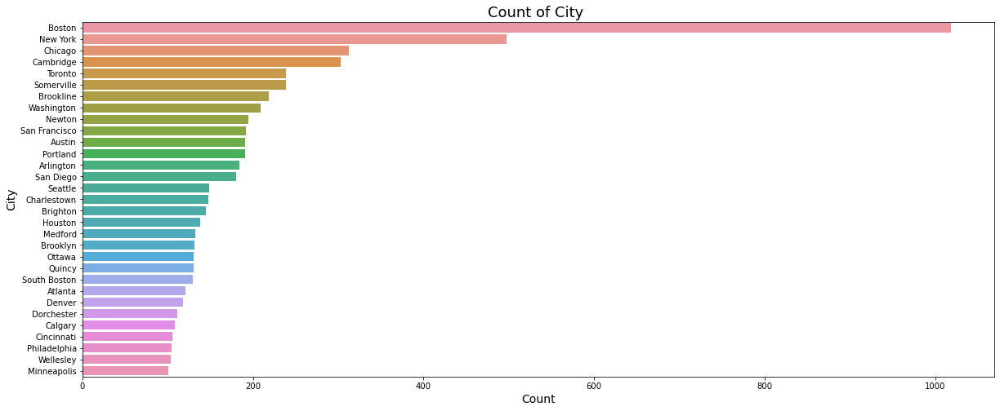

In [39]:
plt.figure(figsize=(20,8))
hage = sns.barplot(y=top_city.index, x = top_city.city,data=top_city)
hage.set_xlabel('Count',fontdict= {'size':14})
hage.set_ylabel(u'City',fontdict= {'size':14})
hage.set_title(u'Count of City ',fontsize=18)
plt.show()

### Bivariate analysis

#### Numeric vs numeric

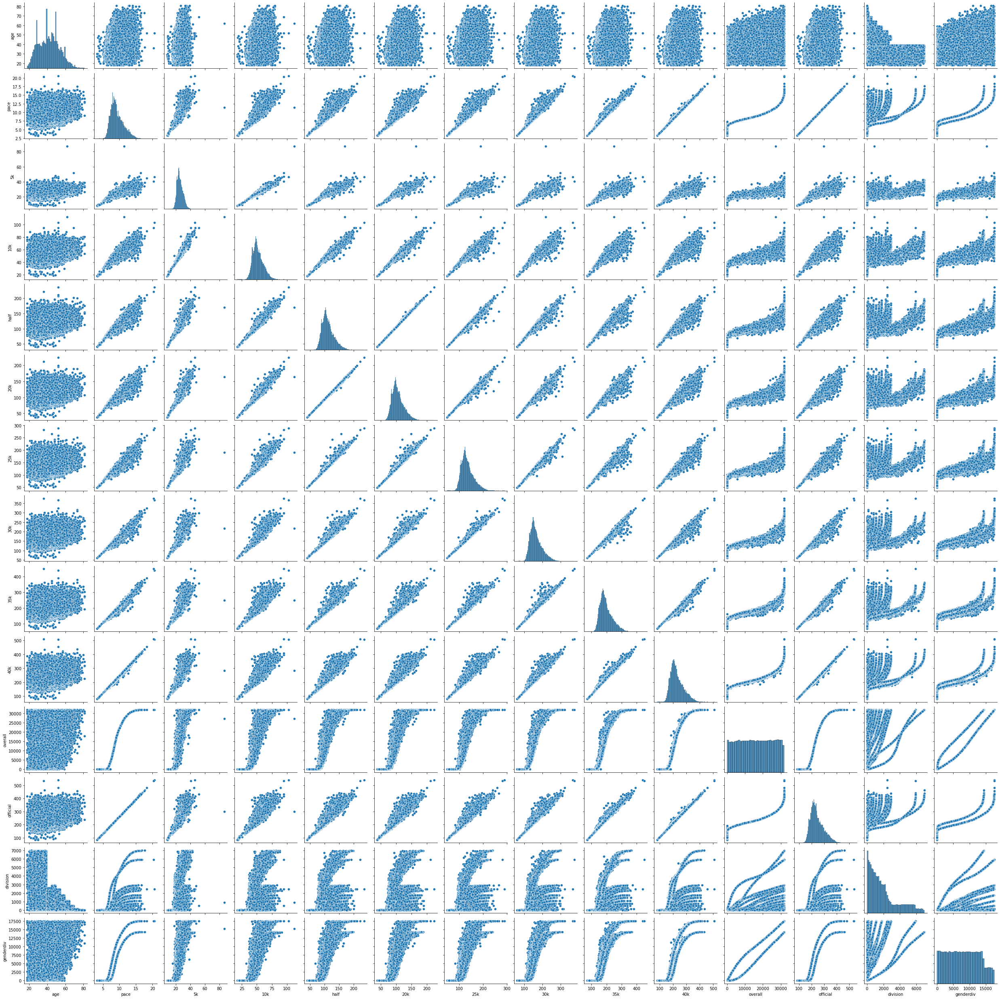

In [40]:
sns.pairplot(df)

Text(0.5, 0.98, 'Bivariate numeric features Plotting')

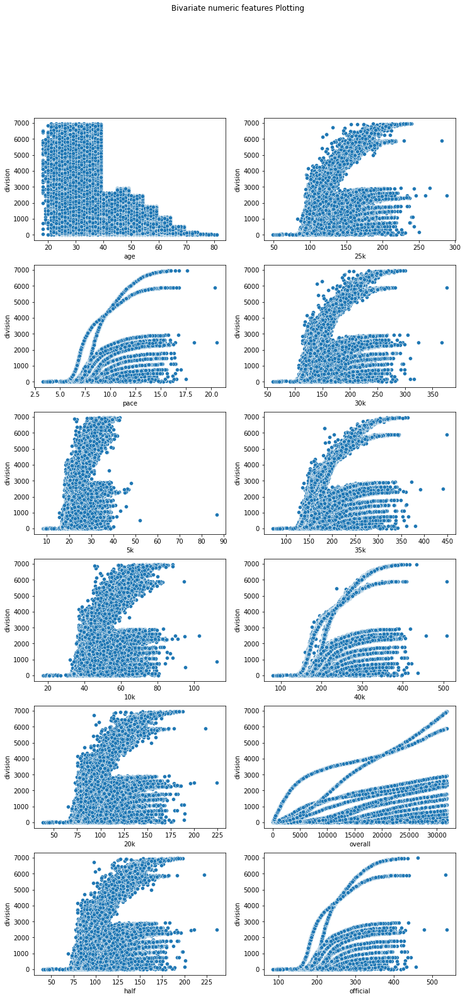

In [41]:
fig, axs = plt.subplots(6, 2, figsize=(12, 25))
sns.scatterplot(ax = axs[0, 0],x = 'age',y = 'division', data =df)
sns.scatterplot(ax = axs[1, 0],x = 'pace',y = 'division', data =df)
sns.scatterplot(ax = axs[2, 0],x = '5k',y = 'division', data =df)
sns.scatterplot(ax = axs[3, 0],x = '10k',y = 'division', data =df)
sns.scatterplot(ax = axs[4, 0],x = '20k',y = 'division', data =df)
sns.scatterplot(ax = axs[5, 0],x = 'half',y = 'division', data =df)
sns.scatterplot(ax = axs[0, 1],x = '25k',y = 'division', data =df)
sns.scatterplot(ax = axs[1, 1],x = '30k',y = 'division', data =df)
sns.scatterplot(ax = axs[2, 1],x = '35k',y = 'division', data =df)
sns.scatterplot(ax = axs[3, 1],x = '40k',y = 'division', data =df)
sns.scatterplot(ax = axs[4, 1],x = 'overall',y = 'division', data =df)
sns.scatterplot(ax = axs[5, 1],x = 'official',y = 'division', data =df)
fig.suptitle('Bivariate numeric features Plotting')

#### Numeric vs. categorical

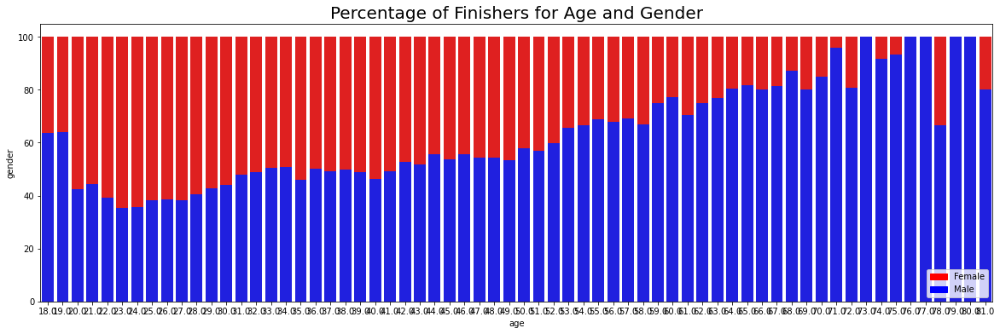

In [42]:
# set the figure size
plt.figure(figsize=(20, 6))

# from raw value to percentage
total = df.groupby('age')['gender'].count().reset_index()
male = df[df.gender=='M'].groupby('age').count().reset_index()
male['gender'] = [i / j * 100 for i,j in zip(male['gender'], total['gender'])]
total['gender'] = [i / j * 100 for i,j in zip(total['gender'], total['gender'])]

bar1 = sns.barplot(x="age",  y="gender", data=total, color='r')
bar2 = sns.barplot(x="age", y="gender", data=male, color='b')

# add legend
top_bar = mpatches.Patch(color='r', label='Female')
bottom_bar = mpatches.Patch(color='b', label='Male')
plt.legend(handles=[top_bar, bottom_bar],loc=4)
bar1.set_title('Percentage of Finishers for Age and Gender', fontsize=20)

# show the graph
plt.show()

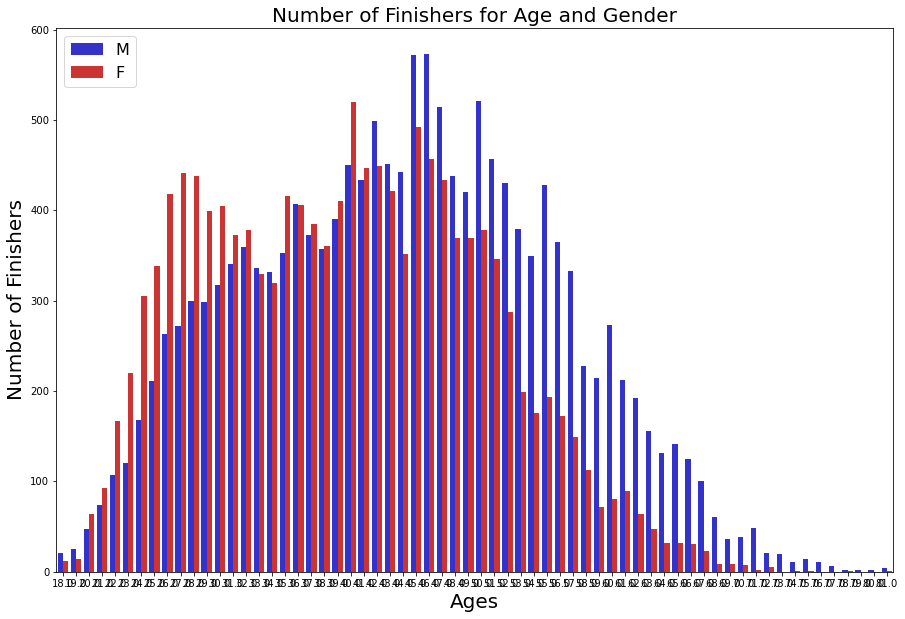

In [43]:
plt.figure(figsize=(15,10))
ax = sns.countplot(x='age', hue='gender', data=df, palette={'F':'r','M':'b'}, saturation=0.6)
ax.set_title('Number of Finishers for Age and Gender', fontsize=20)
ax.set_xlabel('Ages',fontdict={'size':20})
ax.set_ylabel('Number of Finishers',fontdict={'size':20})
ax.legend(fontsize=16)
plt.show()

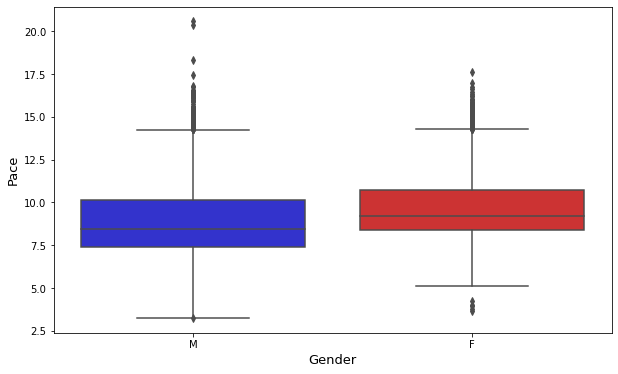

In [44]:
plt.figure(figsize=(10,6))
ax = sns.boxplot(y='pace', x='gender', data=df, palette={'F':'r','M':'b'}, saturation=0.6)
ax.set_xlabel('Gender',fontdict={'size':13})
ax.set_ylabel('Pace',fontdict={'size':13})
plt.show()

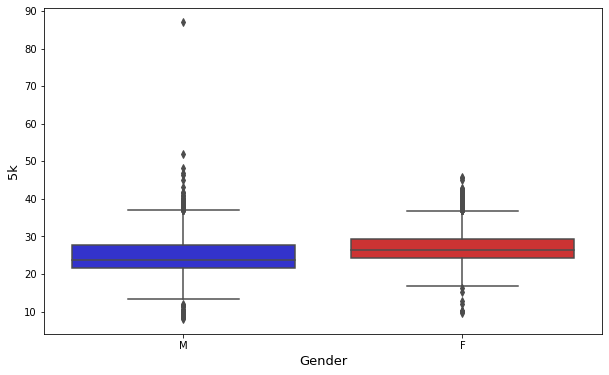

In [45]:
plt.figure(figsize=(10,6))
ax = sns.boxplot(y='5k', x='gender', data=df, palette={'F':'r','M':'b'}, saturation=0.6)
ax.set_xlabel('Gender',fontdict={'size':13})
ax.set_ylabel('5k',fontdict={'size':13})
plt.show()

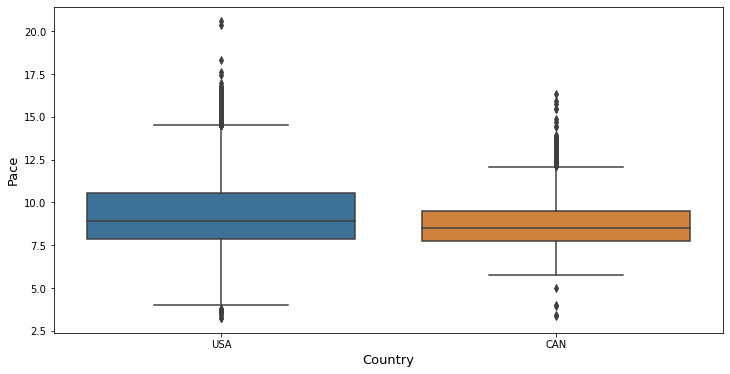

In [46]:
plt.figure(figsize=(12,6))
ax = sns.boxplot(y='pace', x='country', data=df, saturation=0.6)
ax.set_xlabel('Country',fontdict={'size':13})
ax.set_ylabel('Pace',fontdict={'size':13})
plt.show()

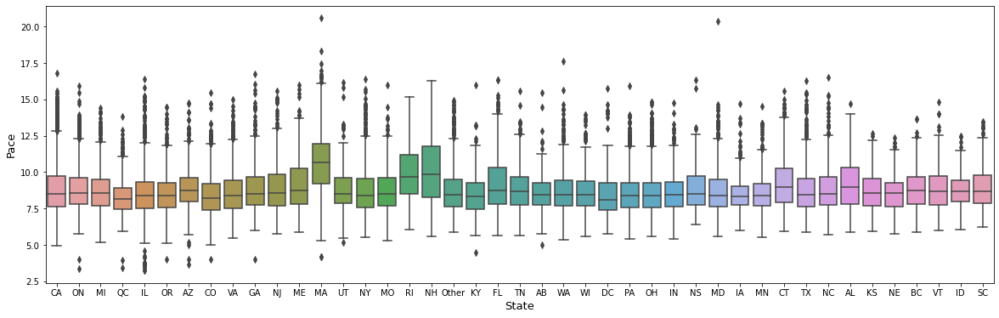

In [47]:
plt.figure(figsize=(20,6))
ax = sns.boxplot(y='pace', x='state', data=df, saturation=0.6)
ax.set_xlabel('State',fontdict={'size':13})
ax.set_ylabel('Pace',fontdict={'size':13})
plt.show()

#### Categorical vs. categorical

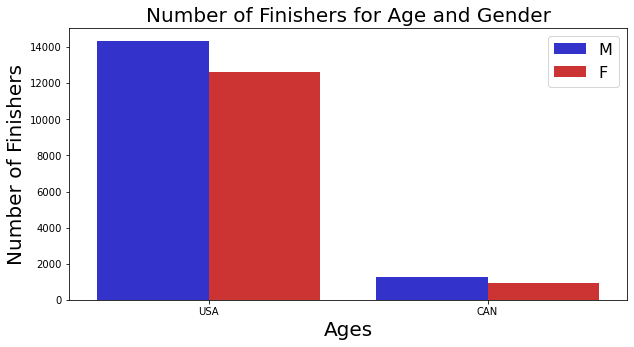

In [48]:
plt.figure(figsize=(10,5))
ax = sns.countplot(x='country', hue='gender', data=df, palette={'F':'r','M':'b'}, saturation=0.6)
ax.set_title('Number of Finishers for Age and Gender', fontsize=20)
ax.set_xlabel('Ages',fontdict={'size':20})
ax.set_ylabel('Number of Finishers',fontdict={'size':20})
ax.legend(fontsize=16)
plt.show()

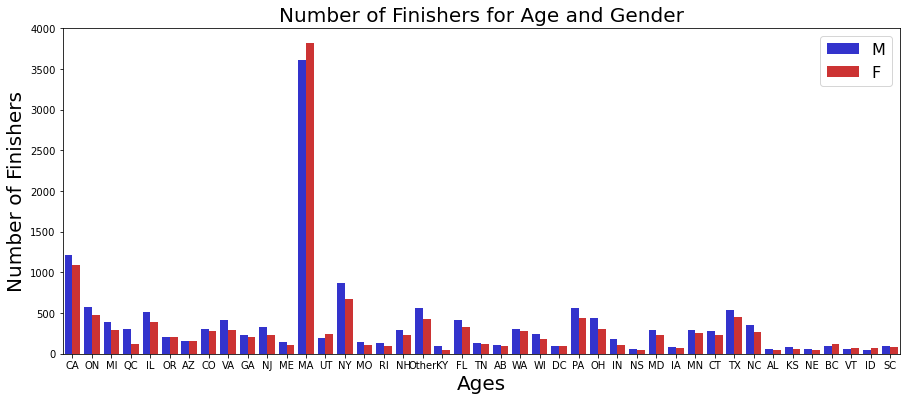

In [49]:
plt.figure(figsize=(15,6))
ax = sns.countplot(x='state', hue='gender', data=df, palette={'F':'r','M':'b'}, saturation=0.6)
ax.set_title('Number of Finishers for Age and Gender', fontsize=20)
ax.set_xlabel('Ages',fontdict={'size':20})
ax.set_ylabel('Number of Finishers',fontdict={'size':20})
ax.legend(fontsize=16)
plt.show()

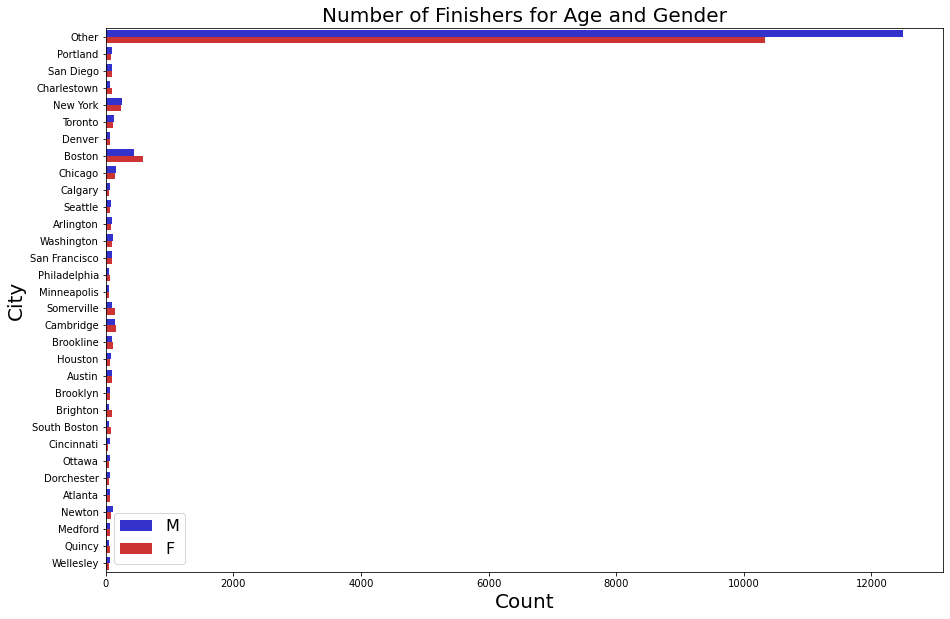

In [50]:
plt.figure(figsize=(15,10))
ax = sns.countplot(y='city', hue='gender', data=df, palette={'F':'r','M':'b'}, saturation=0.6)
ax.set_title('Number of Finishers for Age and Gender', fontsize=20)
ax.set_xlabel('Count',fontdict={'size':20})
ax.set_ylabel('City',fontdict={'size':20})
ax.legend(fontsize=16)
plt.show()

### Multivariate analysis

Text(0.5, 0.98, 'Multivariate numeric features Plotting')

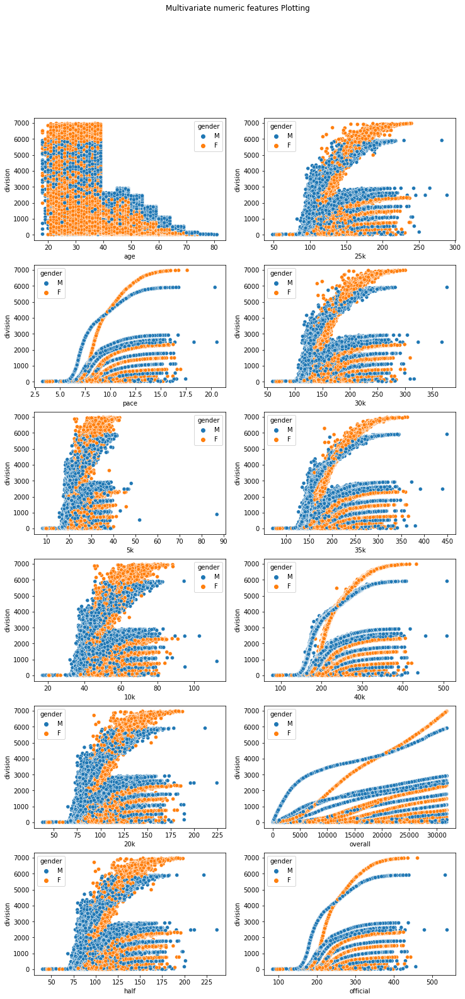

In [51]:
fig, axs = plt.subplots(6, 2, figsize=(12, 25))
sns.scatterplot(ax = axs[0, 0],x = 'age',y = 'division', data =df, hue='gender')
sns.scatterplot(ax = axs[1, 0],x = 'pace',y = 'division', data =df, hue='gender')
sns.scatterplot(ax = axs[2, 0],x = '5k',y = 'division', data =df, hue='gender')
sns.scatterplot(ax = axs[3, 0],x = '10k',y = 'division', data =df, hue='gender')
sns.scatterplot(ax = axs[4, 0],x = '20k',y = 'division', data =df, hue='gender')
sns.scatterplot(ax = axs[5, 0],x = 'half',y = 'division', data =df, hue='gender')
sns.scatterplot(ax = axs[0, 1],x = '25k',y = 'division', data =df, hue='gender')
sns.scatterplot(ax = axs[1, 1],x = '30k',y = 'division', data =df, hue='gender')
sns.scatterplot(ax = axs[2, 1],x = '35k',y = 'division', data =df, hue='gender')
sns.scatterplot(ax = axs[3, 1],x = '40k',y = 'division', data =df, hue='gender')
sns.scatterplot(ax = axs[4, 1],x = 'overall',y = 'division', data =df, hue='gender')
sns.scatterplot(ax = axs[5, 1],x = 'official',y = 'division', data =df, hue='gender')
fig.suptitle('Multivariate numeric features Plotting')

Text(0.5, 0.98, 'Multivariate numeric features Plotting')

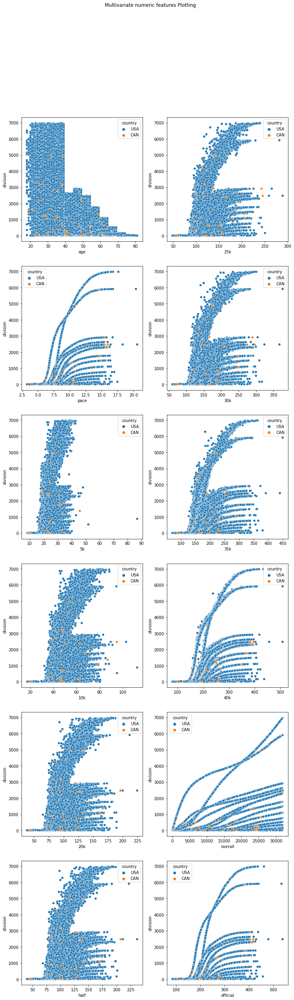

In [52]:
fig, axs = plt.subplots(6, 2, figsize=(12, 40))
sns.scatterplot(ax = axs[0, 0],x = 'age',y = 'division', data =df, hue='country')
sns.scatterplot(ax = axs[1, 0],x = 'pace',y = 'division', data =df, hue='country')
sns.scatterplot(ax = axs[2, 0],x = '5k',y = 'division', data =df, hue='country')
sns.scatterplot(ax = axs[3, 0],x = '10k',y = 'division', data =df, hue='country')
sns.scatterplot(ax = axs[4, 0],x = '20k',y = 'division', data =df, hue='country')
sns.scatterplot(ax = axs[5, 0],x = 'half',y = 'division', data =df, hue='country')
sns.scatterplot(ax = axs[0, 1],x = '25k',y = 'division', data =df, hue='country')
sns.scatterplot(ax = axs[1, 1],x = '30k',y = 'division', data =df, hue='country')
sns.scatterplot(ax = axs[2, 1],x = '35k',y = 'division', data =df, hue='country')
sns.scatterplot(ax = axs[3, 1],x = '40k',y = 'division', data =df, hue='country')
sns.scatterplot(ax = axs[4, 1],x = 'overall',y = 'division', data =df, hue='country')
sns.scatterplot(ax = axs[5, 1],x = 'official',y = 'division', data =df, hue='country')
fig.suptitle('Multivariate numeric features Plotting')

### Correlation

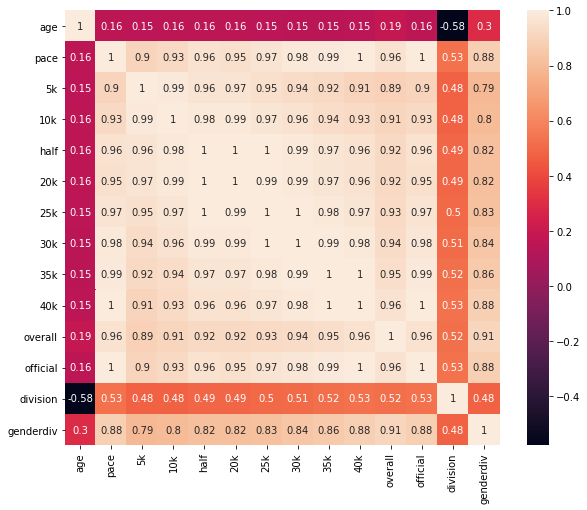

In [53]:
f, ax = plt.subplots(figsize=(10, 8))
ax = sns.heatmap(df.corr(), square=True, annot=True)

# Clustering

## Convert categorical variable into integers

In [54]:
df.describe(include='O')

,bib,name,gender,country,state,city
count,29103,29103,29103,29103,29103,29103
unique,29103,29044,2,2,43,32
top,26880,"Murphy, Dan",M,USA,MA,Other
freq,1,2,15578,26939,7427,22828


In [55]:
lb_encode = LabelEncoder()
df.bib = lb_encode.fit_transform(df.bib)
df.name = lb_encode.fit_transform(df.name)

In [56]:
df_encod = pd.get_dummies(df)

In [57]:
df_encod.shape

(29103, 95)

In [58]:
df_encod.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29103 entries, 9 to 31983
Data columns (total 95 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   bib                 29103 non-null  int64  
 1   name                29103 non-null  int64  
 2   age                 29103 non-null  float64
 3   pace                29103 non-null  float64
 4   5k                  29103 non-null  float64
 5   10k                 29103 non-null  float64
 6   half                29103 non-null  float64
 7   20k                 29103 non-null  float64
 8   25k                 29103 non-null  float64
 9   30k                 29103 non-null  float64
 10  35k                 29103 non-null  float64
 11  40k                 29103 non-null  float64
 12  overall             29103 non-null  float64
 13  official            29103 non-null  float64
 14  division            29103 non-null  float64
 15  genderdiv           29103 non-null  float64
 16  gend

## K-Means model with elbow method

In [59]:
X=df_encod

In [60]:
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(X)
    # inertia method returns wcss for that model
    wcss.append(kmeans.inertia_)

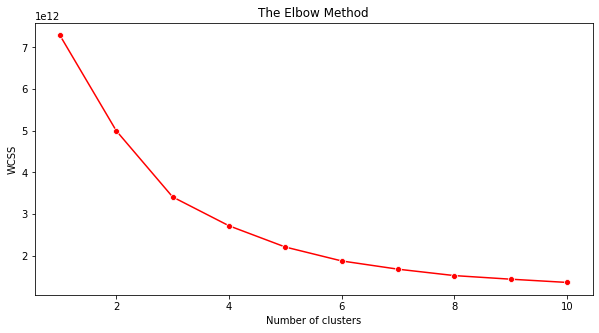

In [61]:
plt.figure(figsize=(10,5))
sns.lineplot(range(1, 11), wcss,marker='o',color='red')
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

## K-Means model parameters study

In [62]:
# Fitting K-Means to the dataset
# k=3
km3 = KMeans(n_clusters = 3, init = 'k-means++', random_state = 42).fit(X)

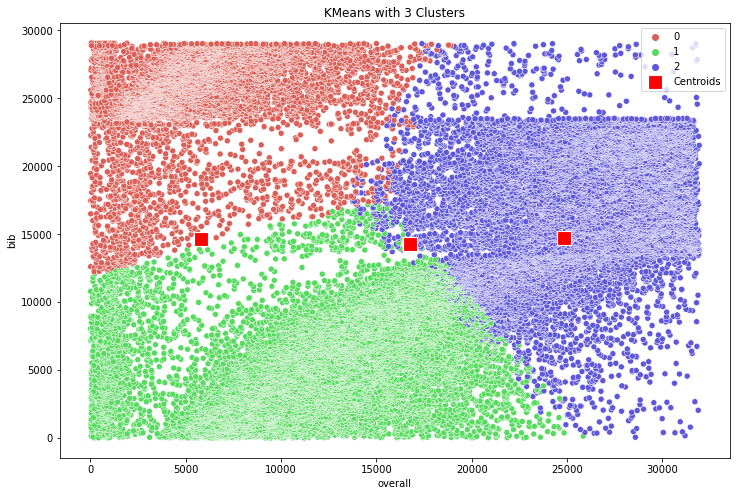

In [63]:
X['labels'] = km3.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(X['overall'],X['bib'],hue=X['labels'], 
                palette=sns.color_palette('hls', 3))
sns.scatterplot(km3.cluster_centers_[:, 0], km3.cluster_centers_[:, 1], color = 'red', 
                label = 'Centroids',s = 200, marker=',')
plt.title('KMeans with 3 Clusters')
plt.show()

## K-Means model with different clusters

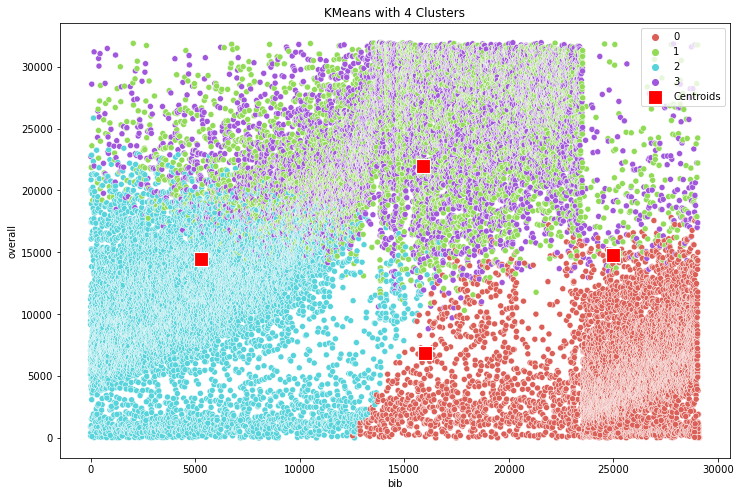

In [64]:
# k = 4
X_1 = df_encod
km4  = KMeans(n_clusters = 4, init = 'k-means++', random_state = 42).fit(X_1)
X_1['labels_4'] = km4.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(X_1['bib'], X_1['overall'], hue=X_1['labels_4'], 
                palette=sns.color_palette('hls', 4))
sns.scatterplot(km4.cluster_centers_[:, 0], km4.cluster_centers_[:, 1], color = 'red', 
                label = 'Centroids',s = 200, marker=',')
plt.title('KMeans with 4 Clusters')
plt.show()

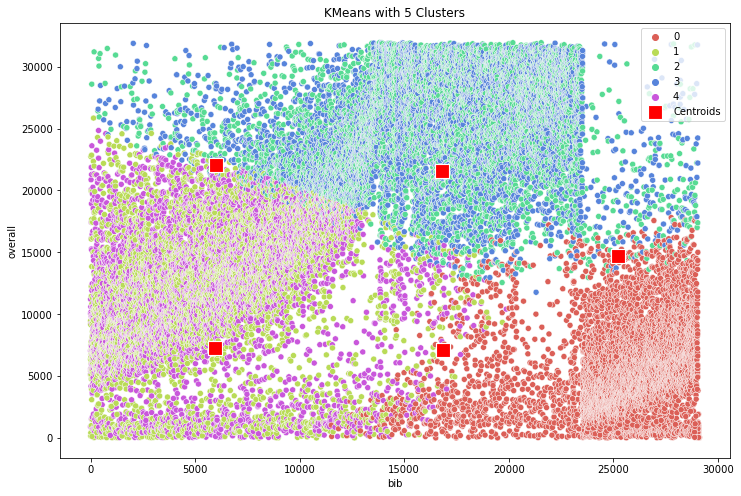

In [65]:
# k = 5
X_2 = df_encod
km5  = KMeans(n_clusters = 5, init = 'k-means++', random_state = 42).fit(X_2)
X['labels_5'] = km5.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(X['bib'], X['overall'], hue=X['labels_5'], 
                palette=sns.color_palette('hls', 5))
sns.scatterplot(km5.cluster_centers_[:, 0], km5.cluster_centers_[:, 1], color = 'red', 
                label = 'Centroids',s = 200, marker=',')
plt.title('KMeans with 5 Clusters')
plt.show()

## Results and conclusion

In [66]:
X.head()

,bib,name,age,pace,5k,10k,half,20k,25k,30k,...,city_San Francisco,city_Seattle,city_Somerville,city_South Boston,city_Toronto,city_Washington,city_Wellesley,labels,labels_4,labels_5
9,25615,10652,31.0,5.27,15.15,30.48,65.23,61.78,77.68,94.78,...,0,0,0,0,0,0,0,0,0,0
14,29102,4007,29.0,3.35,8.02,17.12,40.20,38.02,48.88,60.82,...,0,0,0,0,0,0,0,0,0,0
15,29068,15618,30.0,5.50,16.92,33.93,71.68,67.92,85.03,102.40,...,0,0,0,0,0,0,0,0,0,0
24,29077,8138,47.0,3.42,8.67,18.30,41.80,39.63,50.33,62.33,...,0,0,0,0,0,0,0,0,0,0
27,29078,13963,30.0,3.42,8.98,18.78,41.82,39.65,50.33,62.72,...,0,0,0,0,0,0,0,0,0,0


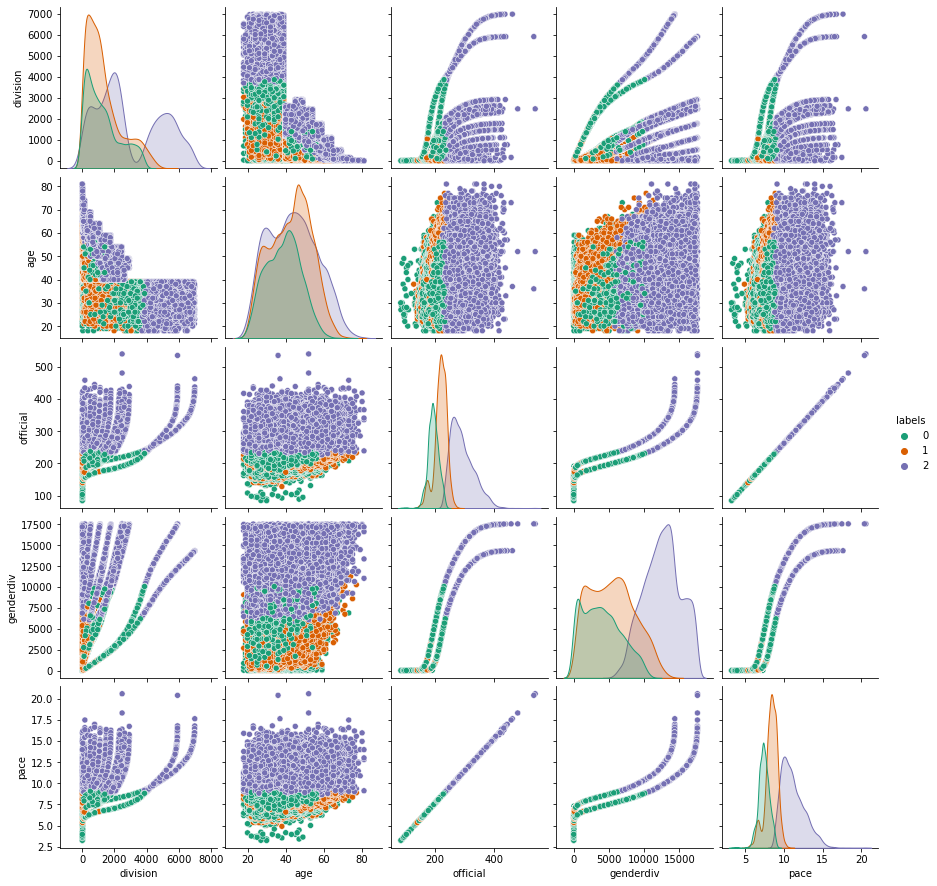

In [67]:
columns_re = ['division', 'age', 'official', 'genderdiv','pace','labels']
X_result = X[columns_re]
sns.pairplot(X_result, hue='labels',palette='Dark2',diag_kind='kde')

## K-Prototype

In [68]:
df.head()

,bib,name,gender,age,pace,5k,10k,half,20k,25k,30k,35k,40k,overall,official,division,genderdiv,country,state,city
9,25615,10652,M,31.0,5.27,15.15,30.48,65.23,61.78,77.68,94.78,112.27,129.83,20.0,137.83,20.0,20.0,USA,CA,Other
14,29102,4007,M,29.0,3.35,8.02,17.12,40.20,38.02,48.88,60.82,72.83,82.38,13.0,87.40,13.0,13.0,CAN,ON,Other
15,29068,15618,F,30.0,5.50,16.92,33.93,71.68,67.92,85.03,102.40,119.68,136.47,46.0,143.90,10.0,10.0,USA,MI,Other
24,29077,8138,M,47.0,3.42,8.67,18.30,41.80,39.63,50.33,62.33,74.95,84.48,14.0,89.40,14.0,14.0,CAN,QC,Other
27,29078,13963,M,30.0,3.42,8.98,18.78,41.82,39.65,50.33,62.72,75.02,84.75,15.0,89.52,15.0,15.0,USA,IL,Other


In [69]:
col_k = ['division', 'age', 'official', 'genderdiv','pace','gender','country','state']
df_kpro = df[col_k]

In [70]:
num_variables = ['division', 'age', 'official', 'genderdiv','pace']
cat_variables = ['gender','country','state']

In [71]:
# Running K-Prototype clustering
kproto = KPrototypes(n_clusters=3, init='Huang', verbose=0, random_state=42,max_iter=20, n_init=50,n_jobs=-2,gamma=.25) 
y_kprototypes = kproto.fit_predict(df_kpro, categorical=[5,6,7])

In [72]:
df_kpro['labels_id']=y_kprototypes

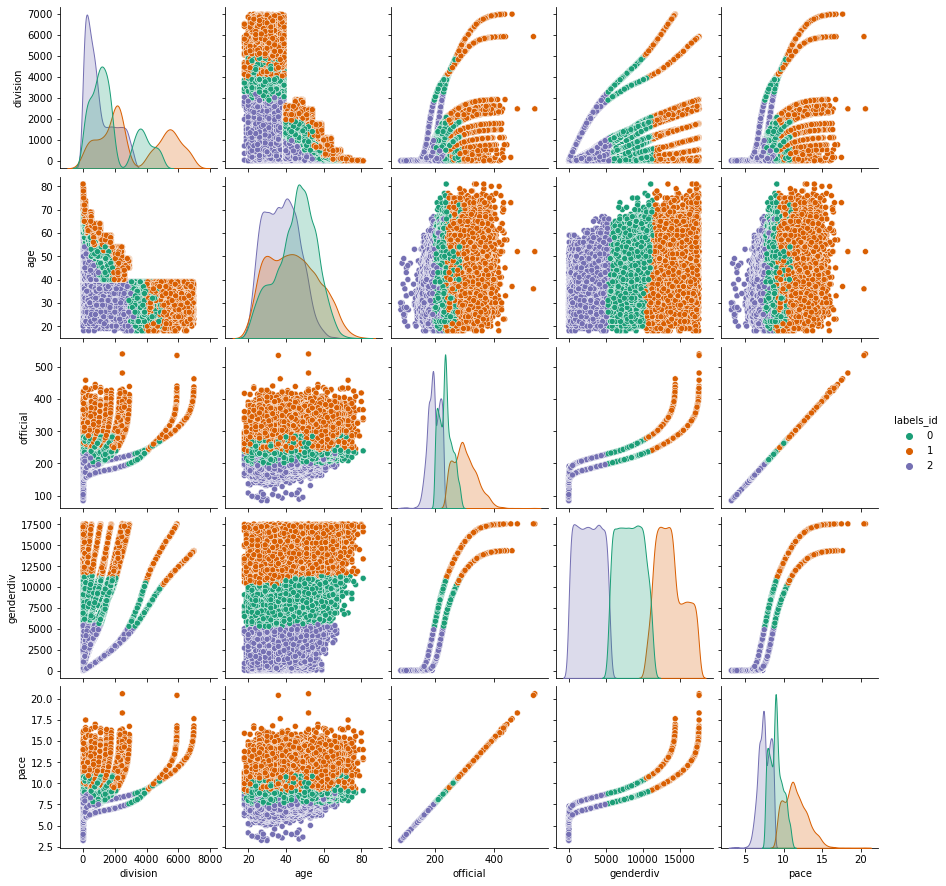

In [73]:
sns.pairplot(df_kpro, hue='labels_id',palette='Dark2',diag_kind='kde')

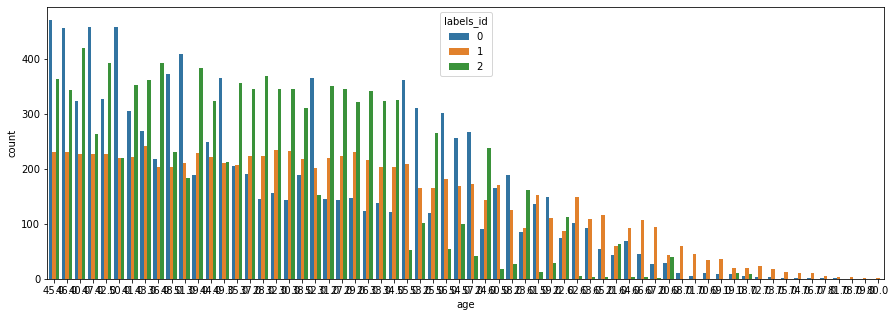

In [74]:
plt.subplots(figsize = (15,5))
sns.countplot(x=df_kpro['age'],order=df_kpro['age'].value_counts().index,hue=df_kpro["labels_id"])
plt.show()

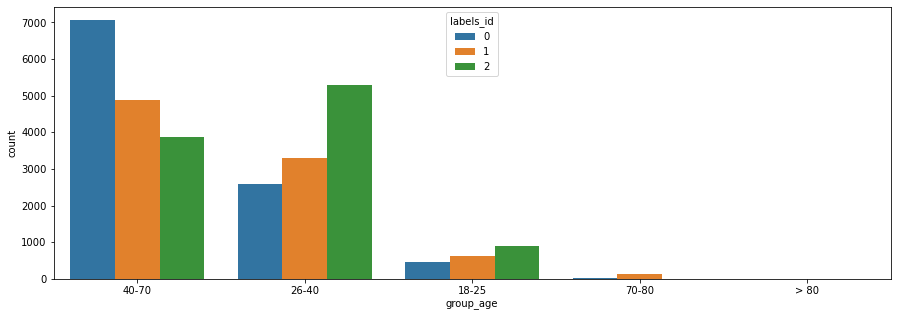

In [75]:
df_3 = df_kpro.copy()
bins = [17, 25, 40,70,80, 90]
df_3['group_age'] = pd.cut(df_3['age'],bins,labels=["18-25", "26-40", "40-70", "70-80","> 80"]) 
plt.subplots(figsize = (15,5))
sns.countplot(x=df_3['group_age'],order=df_3['group_age'].value_counts().index,hue=df_3["labels_id"])
plt.show()

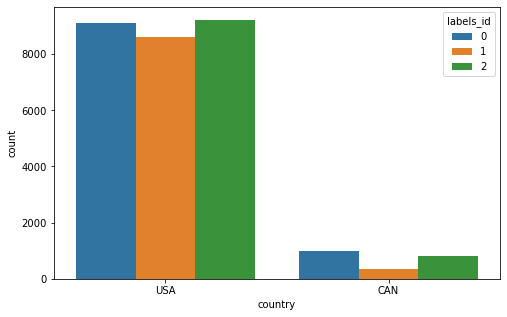

In [76]:
plt.subplots(figsize = (8,5))
sns.countplot(x=df_kpro['country'],order=df_kpro['country'].value_counts().index,hue=df_kpro["labels_id"])
plt.show()

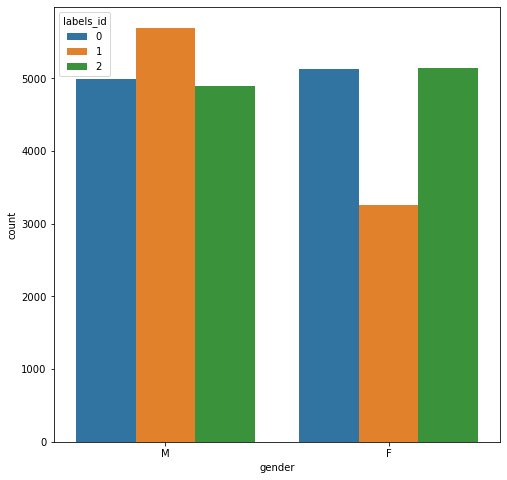

In [77]:
plt.subplots(figsize = (8,8))
sns.countplot(x=df_kpro['gender'],order=df_kpro['gender'].value_counts().index,hue=df_kpro['labels_id'])
plt.show()